In [ ]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Импорт библиотек

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader

import torch.nn.parallel
import torch.backends.cudnn as cudnn

import torchvision
import torchvision.transforms as transforms
from torch.utils.data import Dataset
from torchvision.utils import make_grid

import numpy as np
import matplotlib.pyplot as plt

import os
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2

from tqdm import tqdm

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## Параметры

In [21]:
NUM_EPOCHS = 20
SIZE = 256
BATCH_SIZE = 4
ROOT_MONET = '../input/gan-getting-started/monet_jpg/'
ROOT_PHOTO = '../input/gan-getting-started/photo_jpg/'
SEED = 42
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
LEARNING_RATE = 2e-4
BETAS = (0.5, 0.999)
CYCLE_LAMBDA = 10
IDENTITY_LAMBDA = 0
ngpu = 2

# Загрузка данных

In [65]:
class MonetDataset(Dataset):
    def __init__(self, root_monet, root_photo, transform=None):
        self.root_monet = root_monet
        self.root_photo = root_photo
        self.transform = transform
        
        self.monet_images = os.listdir(root_monet)
        self.photo_images = os.listdir(root_photo)
        
        self.monet_img_len = len(self.monet_images)
        self.photo_img_len = len(self.photo_images)
        self.images_len = max(self.monet_img_len, self.photo_img_len)


    def __len__(self):
        return self.images_len
    
    def __getitem__(self, idx):
        monet_img = os.path.join(self.root_monet, self.monet_images[idx % self.monet_img_len])
        photo_img = os.path.join(self.root_photo, self.photo_images[idx % self.photo_img_len])
        
        monet_img = np.array(Image.open(monet_img).convert("RGB"))
        photo_img = np.array(Image.open(photo_img).convert("RGB"))

        if self.transform:
            augmentation = self.transform(image=photo_img, image0=monet_img) # аугментация в albumentations
            photo_img = augmentation['image']
            monet_img = augmentation['image0']

        return monet_img, photo_img

In [63]:
transforms = A.Compose([A.Resize(height = SIZE ,width = SIZE),
                        A.Normalize(mean=(0.5, 0.5, 0.5),
                                    std=(0.5, 0.5, 0.5),
                                    max_pixel_value=255.0),
                        ToTensorV2()],
                      additional_targets={"image0": "image"})

monet_images = MonetDataset(root_monet=ROOT_MONET,
                            root_photo=ROOT_PHOTO,
                            transform=transforms)

Загрузим в даталодер

In [5]:
loader = DataLoader(dataset=monet_images,
                          batch_size=BATCH_SIZE,
                          shuffle=True,
                          num_workers=2)

Напишем функцию для отображения данных из даталодера

In [6]:
def show_img(img_tensor, title:str, nrows=BATCH_SIZE):
    img_tensor = img_tensor.detach().cpu() * 0.5 + 0.5
    images = make_grid(img_tensor, nrows=nrows).permute(1, 2, 0)
    plt.figure(figsize=(15, 8))
    plt.imshow(images)
    plt.axis('off')
    plt.title(title)
    plt.show()

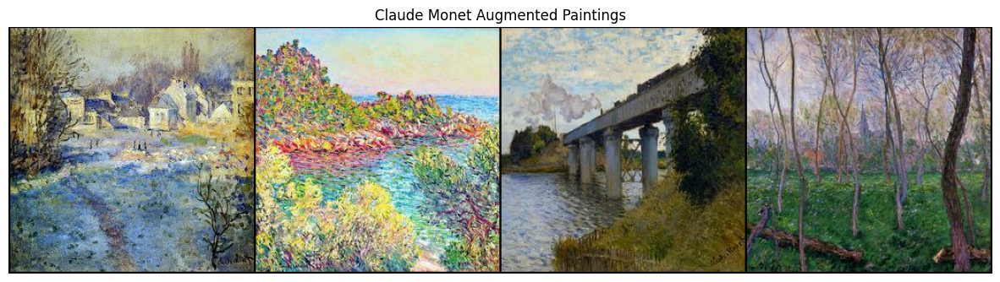

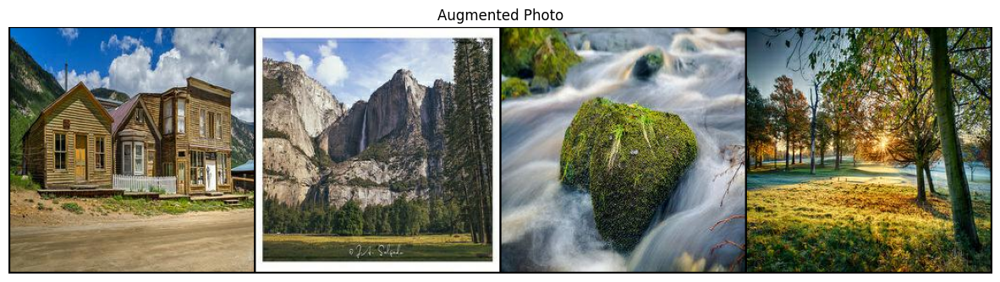

In [7]:
img = next(iter(loader))
show_img(img[0], title='Claude Monet Augmented Paintings')
show_img(img[1], title='Augmented Photo')

# Архитектура модели

Реализуем архитектуру **CycleGAN**. Модель взята из статьи (https://arxiv.org/abs/1703.10593). Будем делать стилизацию обычных фотографий под картины Клода Моне

Ниже представлена архитектура модели

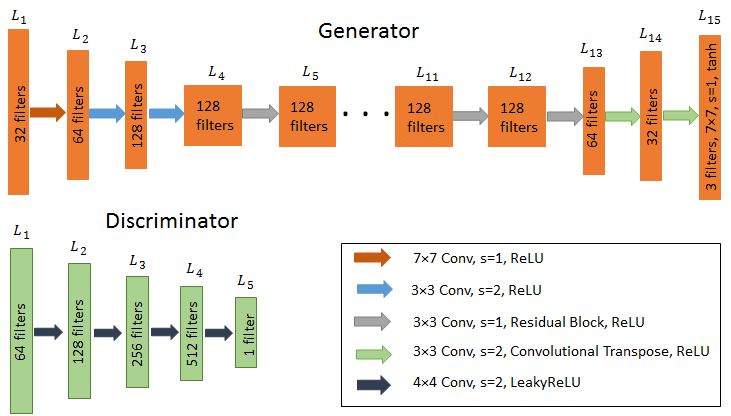

## Дискриминатор

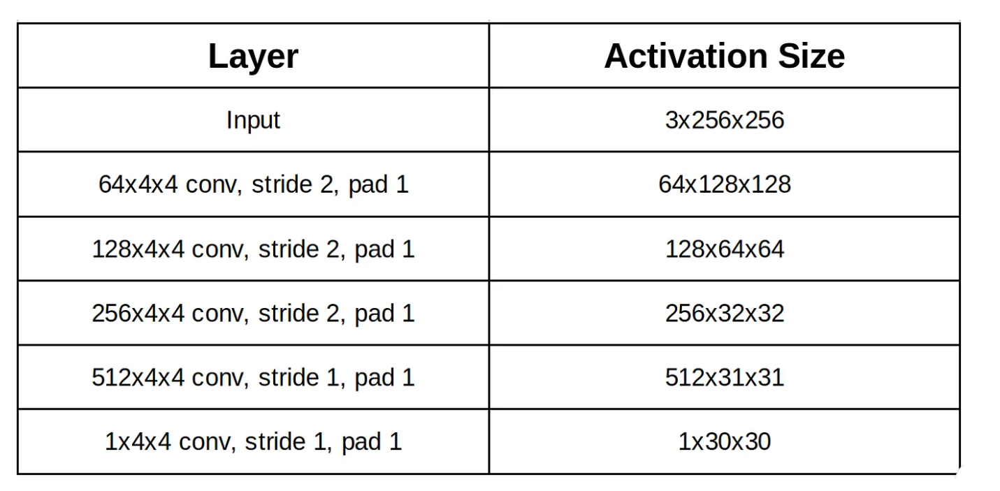

In [9]:
class Block (nn.Module):
    
    def __init__(self, in_channels, out_channels, stride=2):
        super().__init__()
        self.conv = nn.Sequential(     
            nn.Conv2d(in_channels, 
                      out_channels,
                      4,
                      stride,
                      padding=1,
                      padding_mode="reflect"),
            nn.InstanceNorm2d(out_channels),            
            nn.LeakyReLU(0.2, inplace=True))
    
    def forward(self, x):
        return self.conv(x)

In [10]:
class Discriminator(nn.Module):
    def __init__(self, in_channels=3, features=[64, 128, 256, 512]):
        super().__init__()
        self.initial = nn.Sequential(
             nn.Conv2d(in_channels,
                       features[0],
                       kernel_size=4,
                       stride=2,
                       padding=1,
                       padding_mode="reflect"),
             nn.LeakyReLU(0.2, inplace=True))
        
        layers = []
        in_ch = features[0]
        
        for out_ch in features[1:]:
            if out_ch == 512:
                
                layers.append(Block(in_ch,
                                out_ch,
                                stride=1))
            else:
                layers.append(Block(in_ch,
                                out_ch))
            in_ch = out_ch
        
        layers.append(nn.Conv2d(in_ch,
                                out_channels=1,
                                kernel_size=4,
                                stride=1,
                                padding=1,
                                padding_mode="reflect"
                                ))
        self.layers = nn.Sequential(*layers)
    
    def forward(self, x):
        return torch.sigmoid(self.layers(self.initial(x)))

Протестируем модель

In [73]:
x = torch.randn(2, 3, 256, 256)
disc = Discriminator()
disc(x).shape

torch.Size([2, 1, 30, 30])

Дискриминаторы принимают на вход изображение размером 256x256 и выводят тензор размером 30x30.

Каждый нейрон (значение) выходного тензора содержит результат классификации для области входного изображения размером 70x70. Обычно дискриминатор GAN выводит одно значение, обозначающее результат классификации входного изображения. Возвращая тензор размером 30x30, дискриминатор проверяет, кажется ли каждая область 70x70 (эти области перекрывают друг друга) входного изображения реальной или фальшивой. Это эквивалентно выбору вручную каждой из этих областей размером 70х70 и итеративному их исследованию дискриминатором. Наконец, результат классификации всего изображения представляет собой среднее значение результатов классификации значений 30x30.

## Генератор

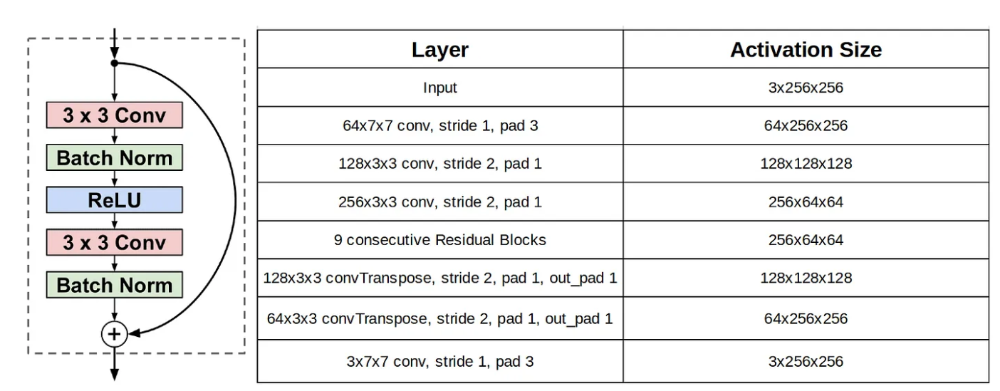

In [12]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=2, down=True, use_act=True, **kwargs):
        super().__init__()
        if down:
            conv = nn.Conv2d(in_channels,
                      out_channels,
                      kernel_size=3,
                      stride=stride,
                      padding=1,
                      padding_mode='reflect',
                      **kwargs)
        else:
            conv = nn.ConvTranspose2d(in_channels, 
                                   out_channels,
                                   kernel_size=3,
                                   stride=stride,
                                   padding=1,
                                   **kwargs)
        
        norm = nn.InstanceNorm2d(out_channels)
        if use_act:
            act = nn.ReLU(inplace=True)
        else:
            act = nn.Identity()
            
        self.conv = nn.Sequential(conv, norm, act)
                    
    def forward(self, x):
        return self.conv(x)
        

In [13]:
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.res = nn.Sequential(
            ConvBlock(channels,
                      channels,
                      stride=1),
        
            ConvBlock(channels,
                      channels,
                      stride=1,
                      use_act=False))
    
    def forward(self, x):
        return x + self.res(x)

In [15]:
class Generator(nn.Module):
    def __init__(self, in_channels=3, out_channels=64, num_resudials = 9):
        super().__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(in_channels,
                      out_channels,
                      kernel_size=7,
                      stride=1,
                      padding=3),
            nn.InstanceNorm2d(out_channels),
            nn.ReLU(inplace=True))
        
        self.down = nn.Sequential(
            ConvBlock(out_channels,
                      out_channels*2),
            ConvBlock(out_channels*2,
                      out_channels*4))
        
        self.res = nn.Sequential(*[ResidualBlock(out_channels*4) for _ in range(num_resudials)])
        
        self.up = nn.Sequential(
            ConvBlock(out_channels*4,
                      out_channels*2,
                      down=False,
                      output_padding=1),
            ConvBlock(out_channels*2,
                      out_channels,
                      down=False,
                      output_padding=1))
        self.last = nn.Conv2d(out_channels,
                              in_channels,
                              kernel_size=7,
                              stride=1,
                              padding=3,
                              padding_mode="reflect"
                             )
    
    def forward(self, x):
        x = self.initial(x)
        x = self.down(x)
        x = self.res(x)
        x = self.up(x)
        x = self.last(x)
        
        return torch.tanh(x)

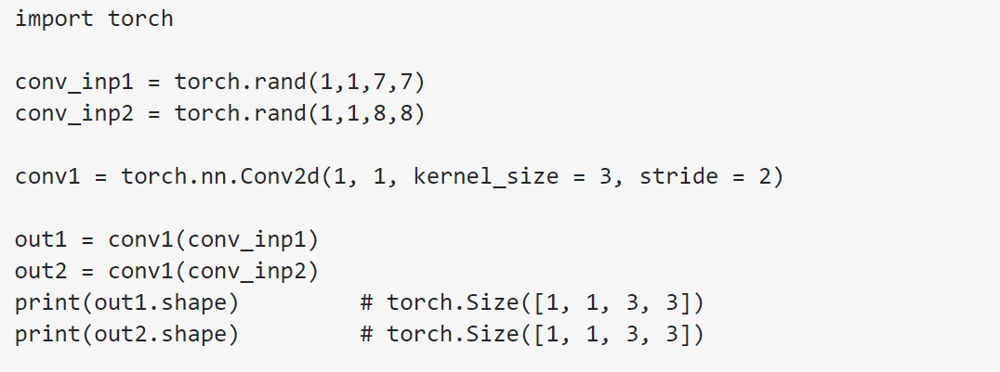

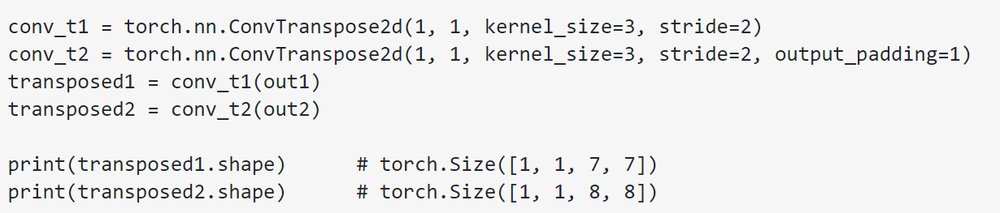

Суть работы **output_padding**

In [74]:
x = torch.randn(2, 3, 256, 256)
gen = Generator()
gen(x).shape

torch.Size([2, 3, 256, 256])

# Обучение

In [41]:
disc_p = Discriminator()
disc_m = Discriminator()
gen_ptm = Generator()
gen_mtp = Generator()

if (DEVICE == 'cuda') and ngpu > 1:
    disc_p = nn.DataParallel(disc_p, device_ids=list(range(ngpu))).cuda()
    disc_m = nn.DataParallel(disc_m, device_ids=list(range(ngpu))).cuda()
    gen_mtp = nn.DataParallel(gen_mtp, device_ids=list(range(ngpu))).cuda()
    gen_ptm = nn.DataParallel(gen_ptm, device_ids=list(range(ngpu))).cuda()

opt_disc = optim.Adam(list(disc_p.parameters()) + list(disc_m.parameters()), 
                      lr=LEARNING_RATE, betas=BETAS)
opt_gen = optim.Adam(list(gen_ptm.parameters()) + list(gen_mtp.parameters()), 
                      lr=LEARNING_RATE, betas=BETAS)

l1_loss = nn.L1Loss()
mse_loss = nn.MSELoss()

G_loss_list = []
D_loss_list = []


torch.cuda.empty_cache()


In [42]:
def train_fn(gen_mtp, gen_ptm, disc_p, disc_m, loader, opt_gen, opt_disc, l1_loss, mse_loss, G_loss_list, D_loss_list):
    
    # Обучение дискриминатора
    loop = tqdm(loader)
    for idx, (monet_img, photo_img) in enumerate(loop):
        monet_img = monet_img.to(DEVICE)
        photo_img = photo_img.to(DEVICE)
        
        # Обучим дискриминатор определять изображения картин Моне
        fake_monet = gen_ptm(photo_img)
        D_m_real = disc_m(monet_img)
        D_m_fake = disc_m(fake_monet.detach())
        
        D_m_fake_loss = mse_loss(D_m_fake, torch.zeros_like(D_m_fake))
        D_m_real_loss = mse_loss(D_m_real, torch.ones_like(D_m_real))
        D_m_loss = D_m_fake_loss + D_m_real_loss
        
        # Обучим дискриминатор определять изображения различных фотографий
        fake_photo = gen_mtp(monet_img)
        D_p_real = disc_p(photo_img)
        D_p_fake = disc_p(fake_photo.detach())
        
        D_p_real_loss = mse_loss(D_p_real, torch.ones_like(D_p_real))
        D_p_fake_loss = mse_loss(D_p_fake, torch.zeros_like(D_p_fake))
        D_p_loss = D_p_real_loss + D_p_fake_loss
        
        # Сложим функции потерь двух дискриминаторов
        D_loss = (D_p_loss + D_m_loss) / 2
        D_loss_list.append(D_loss.item())
        
        opt_disc.zero_grad()
        D_loss.backward()
        opt_disc.step()
        
        # Обучим генераторы
        # Adversarial loss
        D_m_fake = disc_m(fake_monet)
        D_p_fake = disc_p(fake_photo)
        
        G_m_loss = mse_loss(D_m_fake, torch.ones_like(D_m_fake))
        G_p_loss = mse_loss(D_p_fake, torch.ones_like(D_p_fake))

        # Cycle_loss
        cycle_monet = gen_ptm(fake_photo) 
        cycle_m_loss = l1_loss(monet_img, cycle_monet)
        
        cycle_photo = gen_mtp(fake_monet)
        cycle_p_loss = l1_loss(photo_img, cycle_photo)
        
        cycle_loss = cycle_p_loss + cycle_m_loss 

        # Identity loss
        identity_m = gen_ptm(monet_img)
        identity_m_loss = l1_loss(monet_img, identity_m)
        
        identity_p = gen_mtp(photo_img)
        identity_p_loss = l1_loss(photo_img, identity_p)
        
        identity_loss = identity_m_loss + identity_p_loss
        
        # Сложим все функции потерь
        G_loss = (G_m_loss + 
                  G_p_loss + 
                  CYCLE_LAMBDA * cycle_loss +
                  IDENTITY_LAMBDA * identity_loss)
        G_loss_list.append(G_loss.item())
        
        opt_gen.zero_grad()
        G_loss.backward()
        opt_gen.step()
        
        if idx % 200 == 0:
            show_img(photo_img, title='Photo')
            show_img(gen_ptm(photo_img), title='Photo-to-Monet Translation')
         
        loop.set_postfix(gen_loss=round(G_loss.item(), 2), dics_loss=round(D_loss.item(), 2))
    

=========== EPOCH №1 ===========


  0%|          | 0/1760 [00:00<?, ?it/s]

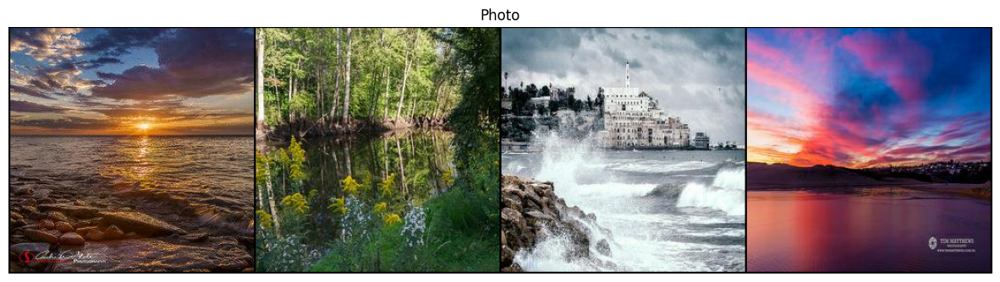

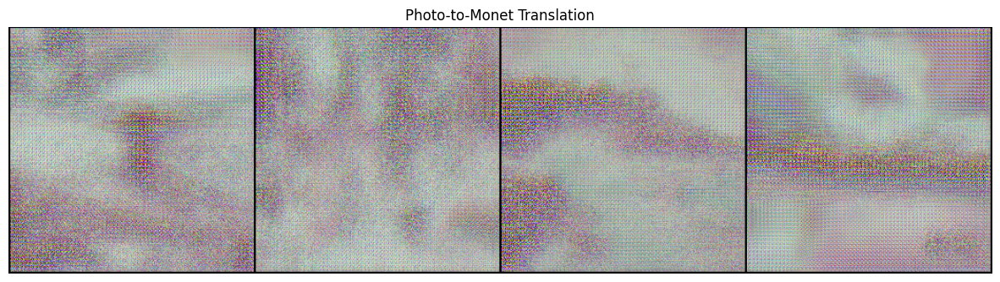

 11%|█▏        | 200/1760 [04:30<34:54,  1.34s/it, dics_loss=0.45, gen_loss=6.9] 

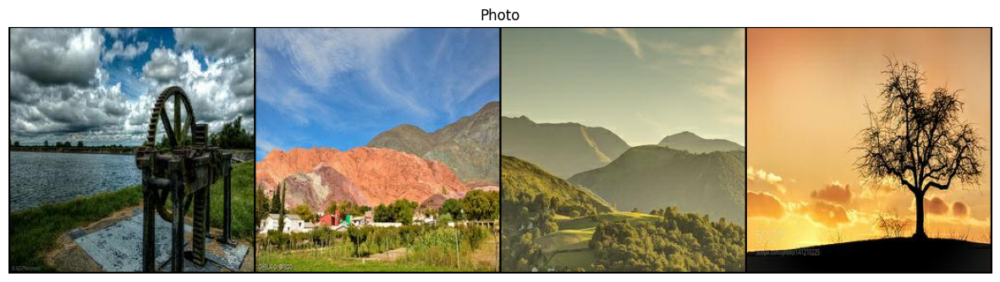

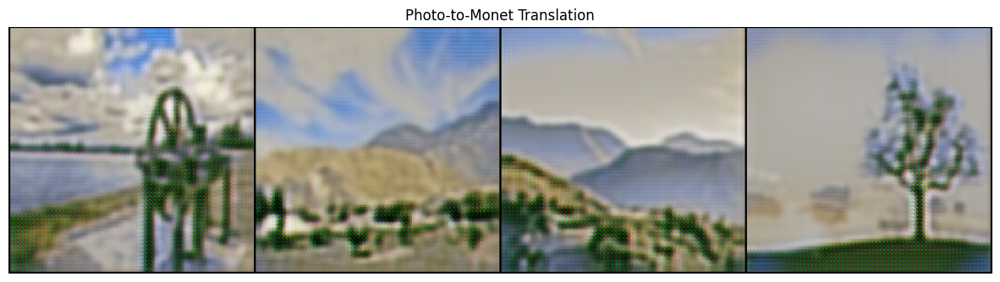

 23%|██▎       | 400/1760 [08:59<30:26,  1.34s/it, dics_loss=0.37, gen_loss=5.5] 

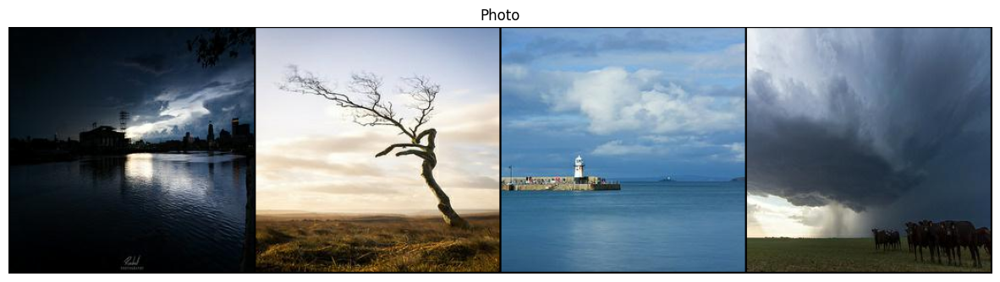

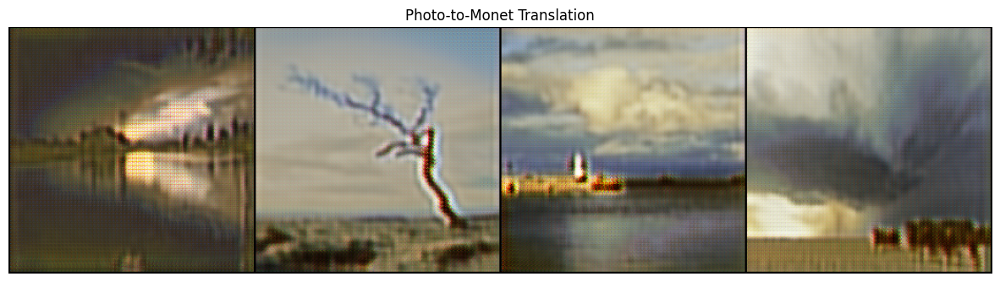

 34%|███▍      | 600/1760 [13:28<25:49,  1.34s/it, dics_loss=0.39, gen_loss=5.94]

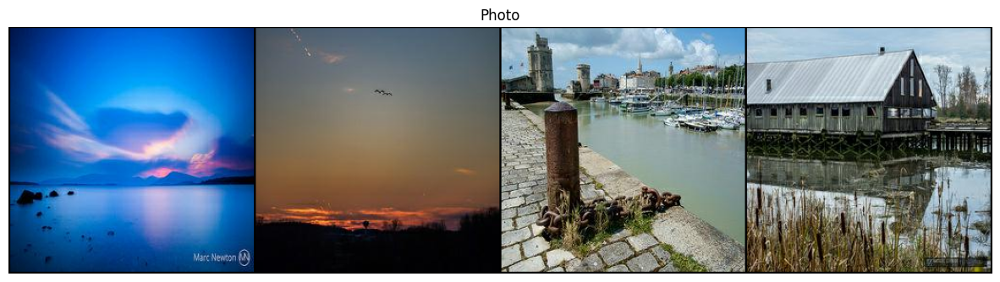

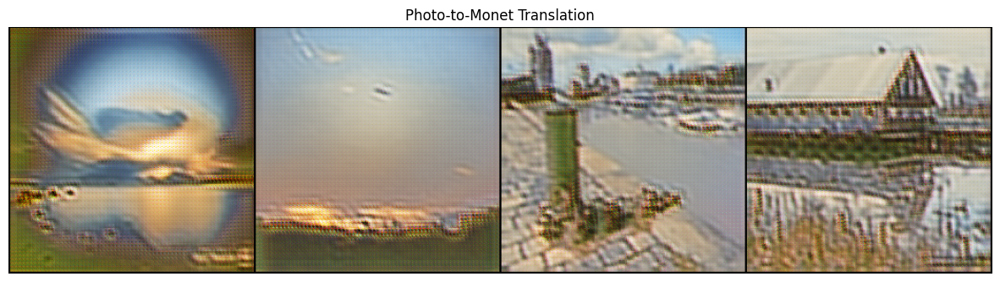

 45%|████▌     | 800/1760 [17:58<21:22,  1.34s/it, dics_loss=0.43, gen_loss=6.81]

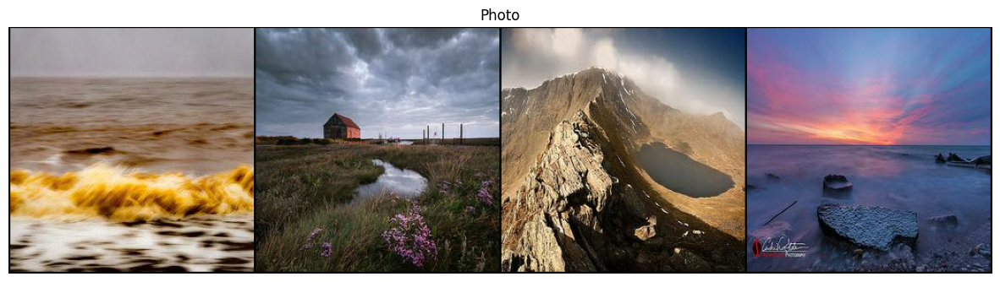

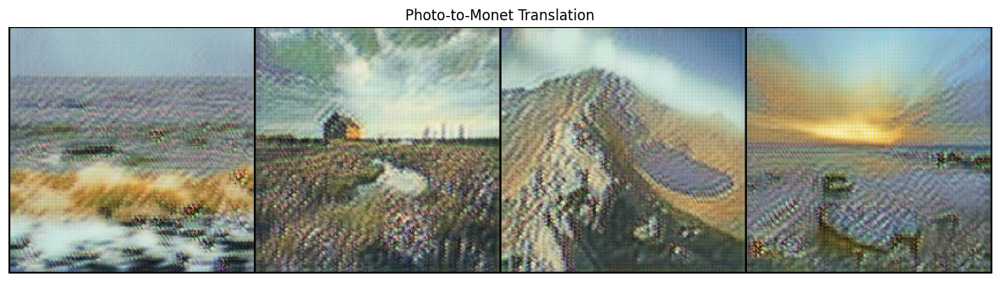

 57%|█████▋    | 1000/1760 [22:27<16:59,  1.34s/it, dics_loss=0.37, gen_loss=4.61]

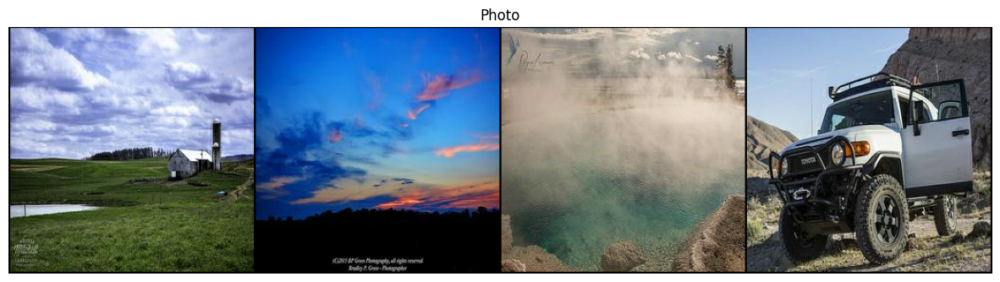

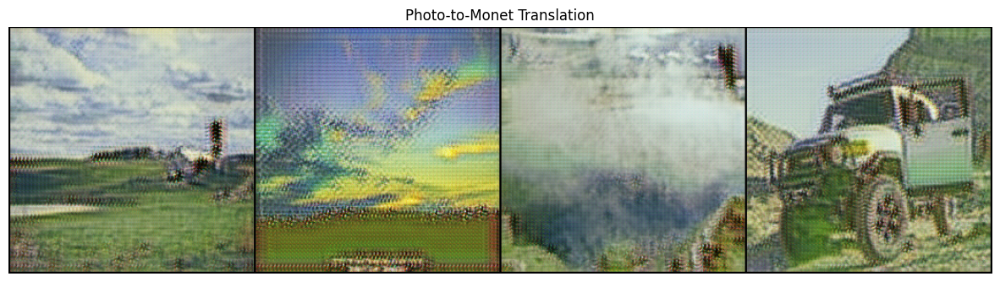

 68%|██████▊   | 1200/1760 [26:56<12:30,  1.34s/it, dics_loss=0.4, gen_loss=4.9]  

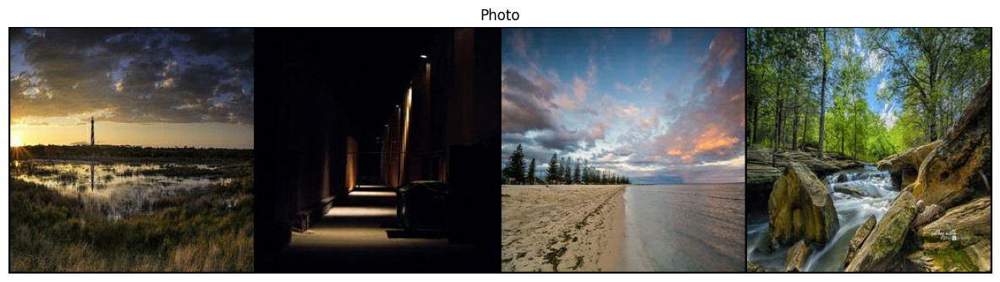

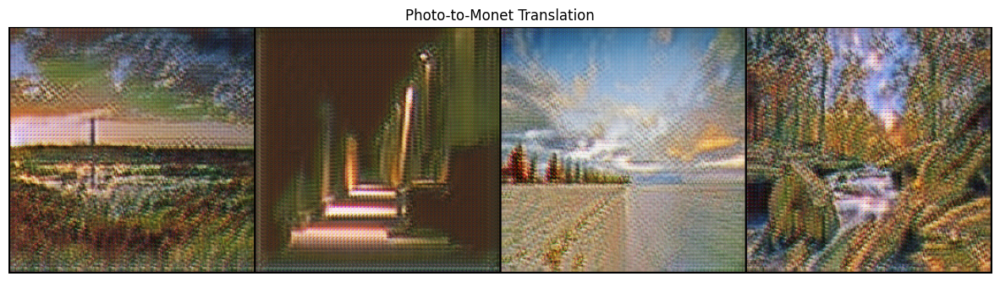

 80%|███████▉  | 1400/1760 [31:25<08:02,  1.34s/it, dics_loss=0.31, gen_loss=5.29]

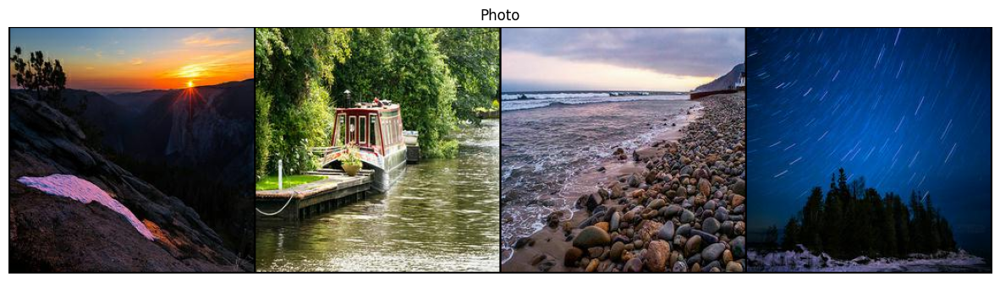

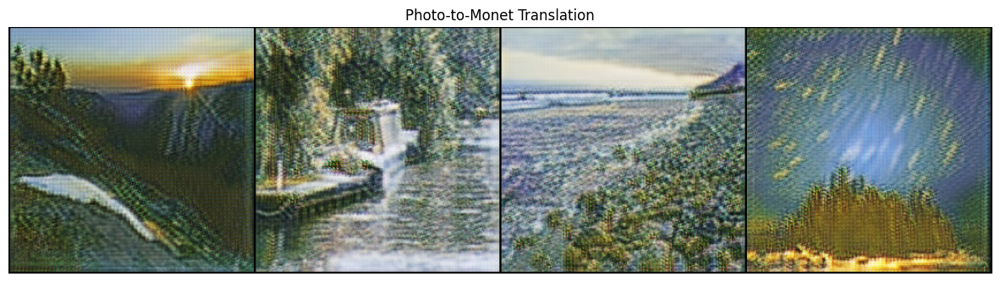

 91%|█████████ | 1600/1760 [35:54<03:34,  1.34s/it, dics_loss=0.43, gen_loss=3.97]

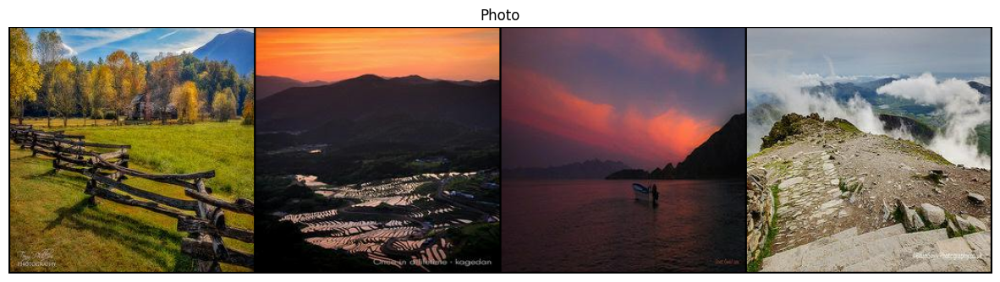

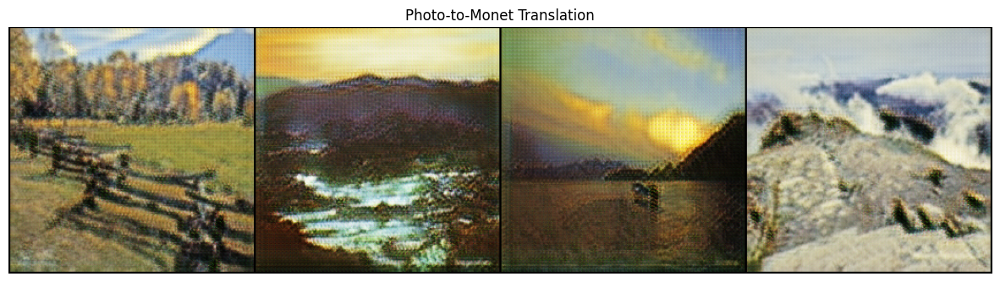

 92%|█████████▏| 1617/1760 [36:18<03:12,  1.35s/it, dics_loss=0.35, gen_loss=4.59]


KeyboardInterrupt: 

In [43]:
for epoch in range(NUM_EPOCHS):
    print(f'=========== EPOCH №{epoch+1} ===========')
    train_fn(gen_mtp,
             gen_ptm,
             disc_p,
             disc_m,
             loader,
             opt_gen,
             opt_disc,
             l1_loss,
             mse_loss,
             G_loss_list,
             D_loss_list)
    

Обучили на одной эпохе. В целом этого достаточно, но думаю, что обучение дальше помогло бы лучше стилизовать фото под картины Моне

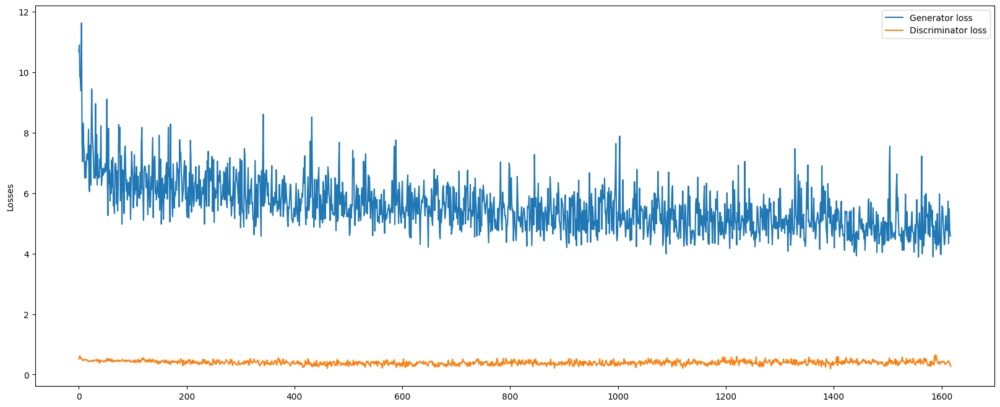

In [46]:
plt.figure(figsize=(20,8))
plt.ylabel('Losses')
plt.plot(G_loss_list, label="Generator loss")
plt.plot(D_loss_list, label='Discriminator loss')
plt.legend()
plt.show()

### Сохранение весов моделей

In [ ]:
# Save the Modle to file in the current working directory

Pkl_Filename_g_ptm = "Gen_ptm.pkl"
Pkl_Filename_g_mtp = "Gen_mtp.pkl"  

Pkl_Filename_d_m = "Disc_m.pkl"
Pkl_Filename_d_p = "Disc_p.pkl"  

with open(Pkl_Filename_g_ptm, 'wb') as file_g_ptm:  
    pickle.dump(gen_ptm, file_g_ptm)

with open(Pkl_Filename_g_mtp, 'wb') as file_g_mtp:  
    pickle.dump(gen_mtp, file_g_mtp)
    
with open(Pkl_Filename_d_m, 'wb') as file_d_m:  
    pickle.dump(disc_m, file_d_m)

with open(Pkl_Filename_d_p, 'wb') as file_d_p:  
    pickle.dump(disc_p, file_d_p)